In [ ]:
#Complete Bug Detection ML Pipeline
#Includes: Data Preprocessing, TF-IDF, Multiple Models, Evaluation & Visualization
!pip install imbalanced-learn wordcloud

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, precision_recall_fscore_support,
                             roc_auc_score, roc_curve)
from imblearn.over_sampling import SMOTE
from wordcloud import WordCloud
import re
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Set visualization style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)

In [ ]:
df = pd.read_csv('/content/sample_data/bug_classification_dataset_v2_7000_MERGED_RECLASSIFIED.csv')


In [ ]:
print("="*70)
print("DATASET OVERVIEW")
print("="*70)
print(f"Total Records: {len(df)}")
print(f"\nDataset Shape: {df.shape}")
print(f"\nColumns: {df.columns.tolist()}")
print(f"\nFirst few rows:")
print(df.head())

DATASET OVERVIEW
Total Records: 4538

Dataset Shape: (4538, 7)

Columns: ['Bug_ID', 'Title', 'Description', 'Module', 'Severity', 'Bug_Type', 'Severity_Score']

First few rows:
      Bug_ID                                              Title  \
0  BUG-00001                    SourceTree 3.4.8 keep crashing    
1  BUG-00002  Syntax highlighting is applied to "No newline ...   
2  BUG-00003        SourceTree insists handling a specific repo   
3  BUG-00004                             Pressure various near.   
4  BUG-00005  Custom Actions is not working when set paramet...   

                                         Description   Module Severity  \
0  All of the sudden sourcetree crashes. So I tri...      Git      Low   
1  # Create a file in a language for which syntax...       UX      Low   
2  Hi. Using SourceTree (ST) v3.1.2 (but problem ...  Askpass      Low   
3  Build world other attack kind country intervie...    Cache     High   
4  Firstly, I made custom action with one paramet.

DATA PREPROCESSING

In [ ]:
print("\n" + "="*70)
print("DATA PREPROCESSING")
print("="*70)

# Combine Title and Description for richer features
df['Text'] = df['Title'] + ' ' + df['Description']

# Check for missing values
print(f"\nMissing values:\n{df.isnull().sum()}")

# Remove duplicates
df = df.drop_duplicates(subset=['Text'])
print(f"\nRecords after removing duplicates: {len(df)}")

# Text cleaning function
def clean_text(text):
    """Clean and preprocess text data"""
    if pd.isna(text):
        return ""
    # Convert to lowercase
    text = text.lower()
    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', ' ', text)
    # Remove extra whitespace
    text = re.sub(r'\s+', ' ', text).strip()
    return text

# Apply text cleaning
df['Cleaned_Text'] = df['Text'].apply(clean_text)

# Display sample cleaned text
print("\nSample cleaned text:")
print(df[['Text', 'Cleaned_Text']].head(3))

# Encode target variable
le = LabelEncoder()
df['Bug_Type_Encoded'] = le.fit_transform(df['Bug_Type'])

# Display bug type distribution
print(f"\nBug Type Distribution:")
print(df['Bug_Type'].value_counts())


DATA PREPROCESSING

Missing values:
Bug_ID             0
Title              0
Description        0
Module            24
Severity           0
Bug_Type           0
Severity_Score     0
Text               0
dtype: int64

Records after removing duplicates: 4538

Sample cleaned text:
                                                Text  \
0  SourceTree 3.4.8 keep crashing  All of the sud...   
1  Syntax highlighting is applied to "No newline ...   
2  SourceTree insists handling a specific repo Hi...   

                                        Cleaned_Text  
0  sourcetree keep crashing all of the sudden sou...  
1  syntax highlighting is applied to no newline a...  
2  sourcetree insists handling a specific repo hi...  

Bug Type Distribution:
Bug_Type
Functional Bug       700
UI Bug               637
Compatibility Bug    268
Other Bug            214
ui bug               213
Performance Bug      212
Logic Bug            168
API Bug              136
security bug         135
api bug         

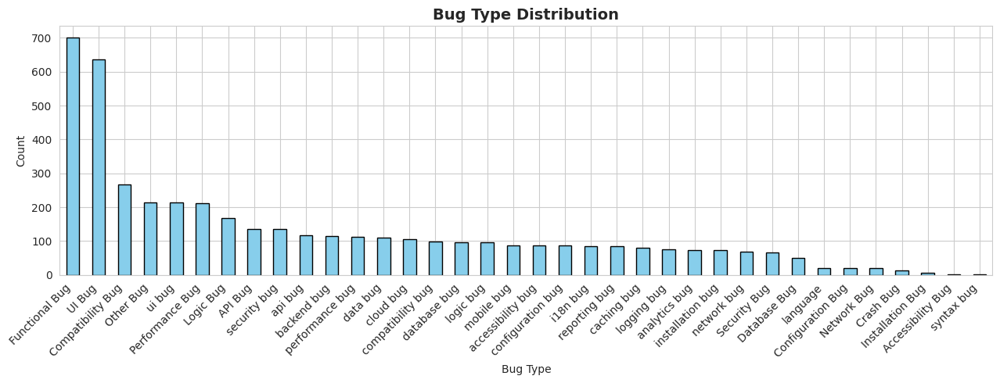

In [ ]:
# Visualize bug type distribution
plt.figure(figsize=(25, 5))
plt.subplot(1, 2, 1)
df['Bug_Type'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Bug Type Distribution', fontsize=14, fontweight='bold')
plt.xlabel('Bug Type')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()


plt.show()

TF-IDF FEATURE EXTRACTION

In [ ]:
print("\n" + "="*70)
print("TF-IDF FEATURE EXTRACTION")
print("="*70)

# Split data into training and testing sets
X = df['Cleaned_Text']
y = df['Bug_Type_Encoded']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

print(f"\nTraining set size: {len(X_train)}")
print(f"Testing set size: {len(X_test)}")

# TF-IDF Vectorization
tfidf = TfidfVectorizer(
    max_features=500,
    ngram_range=(1, 2),  # Use unigrams and bigrams
    min_df=1,
    max_df=0.9,
    sublinear_tf=True
)

X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

print(f"\nTF-IDF Feature Matrix Shape: {X_train_tfidf.shape}")
print(f"Number of features: {len(tfidf.get_feature_names_out())}")

# Display top TF-IDF features
feature_names = tfidf.get_feature_names_out()
print(f"\nSample features: {list(feature_names[:20])}")


TF-IDF FEATURE EXTRACTION

Training set size: 3403
Testing set size: 1135

TF-IDF Feature Matrix Shape: (3403, 500)
Number of features: 500

Sample features: ['aborted', 'aborted context', 'accessible', 'accessible actual', 'account', 'action', 'actual', 'actual data', 'actual exception', 'actual state', 'actual ui', 'actual unexpected', 'actual wrong', 'add', 'affected', 'affected on', 'after', 'after deployment', 'after dispose', 'after minutes']


HANDLE CLASS IMBALANCE

In [ ]:
print("\n" + "="*70)
print("HANDLING CLASS IMBALANCE WITH SMOTE")
print("="*70)

print(f"\nClass distribution before SMOTE:")
print(pd.Series(y_train).value_counts())

# Apply SMOTE for handling imbalanced data
smote = SMOTE(random_state=42, k_neighbors=1)  # k_neighbors=1 for small dataset
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_tfidf, y_train)

print(f"\nClass distribution after SMOTE:")
print(pd.Series(y_train_balanced).value_counts())


HANDLING CLASS IMBALANCE WITH SMOTE

Class distribution before SMOTE:
Bug_Type_Encoded
6     525
13    478
2     201
35    160
10    160
11    159
8     126
0     102
33    101
16     87
31     85
17     85
22     83
19     79
20     73
23     73
28     71
29     66
14     65
21     64
24     64
32     63
18     61
27     57
15     55
25     55
30     52
12     49
5      38
3      16
26     16
9      14
4      11
7       5
34      2
1       2
Name: count, dtype: int64

Class distribution after SMOTE:
Bug_Type_Encoded
17    525
20    525
16    525
13    525
31    525
21    525
33    525
35    525
2     525
6     525
10    525
11    525
8     525
22    525
25    525
23    525
0     525
5     525
18    525
19    525
29    525
15    525
3     525
30    525
32    525
27    525
14    525
12    525
7     525
28    525
24    525
26    525
9     525
34    525
4     525
1     525
Name: count, dtype: int64


TRAIN MULTIPLE MODELS

In [ ]:
print("\n" + "="*70)
print("TRAINING MULTIPLE MODELS")
print("="*70)

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Naive Bayes': MultinomialNB(),
}

results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Train model
    model.fit(X_train_balanced, y_train_balanced)

    # Predictions
    y_pred = model.predict(X_test_tfidf)
    y_pred_proba = model.predict_proba(X_test_tfidf) if hasattr(model, 'predict_proba') else None

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')

    # Cross-validation score
    cv_scores = cross_val_score(model, X_train_balanced, y_train_balanced, cv=3)

    results[name] = {
        'model': model,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'cv_mean': cv_scores.mean(),
        'cv_std': cv_scores.std(),
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }

    print(f"  Accuracy: {accuracy:.4f}")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall: {recall:.4f}")
    print(f"  F1-Score: {f1:.4f}")
    print(f"  CV Score: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")


TRAINING MULTIPLE MODELS

Training Logistic Regression...
  Accuracy: 0.5833
  Precision: 0.6488
  Recall: 0.5833
  F1-Score: 0.6029
  CV Score: 0.7749 (+/- 0.0187)

Training Random Forest...
  Accuracy: 0.6511
  Precision: 0.6751
  Recall: 0.6511
  F1-Score: 0.6564
  CV Score: 0.9610 (+/- 0.0170)

Training Naive Bayes...
  Accuracy: 0.4018
  Precision: 0.5844
  Recall: 0.4018
  F1-Score: 0.4521
  CV Score: 0.5431 (+/- 0.0066)


In [ ]:
print("\n" + "="*70)
print("MODEL PERFORMANCE SUMMARY")
print("="*70)

# Create comparison dataframe
comparison_df = pd.DataFrame({
    'Model': list(results.keys()),
    'Accuracy': [results[m]['accuracy'] for m in results.keys()],
    'Precision': [results[m]['precision'] for m in results.keys()],
    'Recall': [results[m]['recall'] for m in results.keys()],
    'F1-Score': [results[m]['f1_score'] for m in results.keys()],
    'CV Mean': [results[m]['cv_mean'] for m in results.keys()]
})

comparison_df = comparison_df.sort_values('Accuracy', ascending=False)
print("\n", comparison_df.to_string(index=False))

# Find best model
best_model_name = comparison_df.iloc[0]['Model']
best_model = results[best_model_name]['model']
print(f"\n🏆 BEST MODEL: {best_model_name}")
print(f"   Accuracy: {results[best_model_name]['accuracy']:.4f}")


MODEL PERFORMANCE SUMMARY

               Model  Accuracy  Precision   Recall  F1-Score  CV Mean
      Random Forest  0.651101   0.675137 0.651101  0.656372 0.961005
Logistic Regression  0.583260   0.648810 0.583260  0.602896 0.774921
        Naive Bayes  0.401762   0.584421 0.401762  0.452136 0.543122

🏆 BEST MODEL: Random Forest
   Accuracy: 0.6511


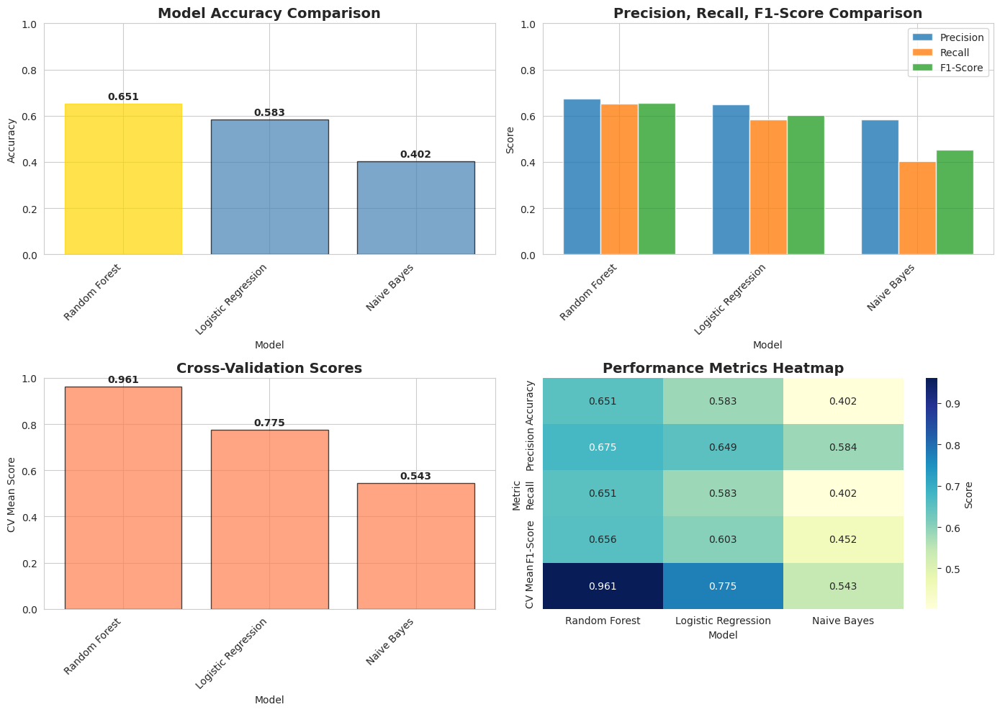

In [ ]:
# Visualize model comparison
plt.figure(figsize=(14, 10))

# Subplot 1: Accuracy comparison
plt.subplot(2, 2, 1)
bars = plt.bar(comparison_df['Model'], comparison_df['Accuracy'],
               color='steelblue', edgecolor='black', alpha=0.7)
bars[0].set_color('gold')  # Highlight best model
plt.title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45, ha='right')
plt.ylim([0, 1])
for i, v in enumerate(comparison_df['Accuracy']):
    plt.text(i, v + 0.02, f'{v:.3f}', ha='center', fontweight='bold')

# Subplot 2: Precision, Recall, F1-Score
plt.subplot(2, 2, 2)
x = np.arange(len(comparison_df))
width = 0.25
plt.bar(x - width, comparison_df['Precision'], width, label='Precision', alpha=0.8)
plt.bar(x, comparison_df['Recall'], width, label='Recall', alpha=0.8)
plt.bar(x + width, comparison_df['F1-Score'], width, label='F1-Score', alpha=0.8)
plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Precision, Recall, F1-Score Comparison', fontsize=14, fontweight='bold')
plt.xticks(x, comparison_df['Model'], rotation=45, ha='right')
plt.legend()
plt.ylim([0, 1])

# Subplot 3: Cross-validation scores
plt.subplot(2, 2, 3)
plt.bar(comparison_df['Model'], comparison_df['CV Mean'],
        color='coral', edgecolor='black', alpha=0.7)
plt.title('Cross-Validation Scores', fontsize=14, fontweight='bold')
plt.xlabel('Model')
plt.ylabel('CV Mean Score')
plt.xticks(rotation=45, ha='right')
plt.ylim([0, 1])
for i, v in enumerate(comparison_df['CV Mean']):
    plt.text(i, v + 0.02, f'{v:.3f}', ha='center', fontweight='bold')

# Subplot 4: Overall performance heatmap
plt.subplot(2, 2, 4)
heatmap_data = comparison_df[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'CV Mean']].T
sns.heatmap(heatmap_data, annot=True, fmt='.3f', cmap='YlGnBu',
            xticklabels=comparison_df['Model'], cbar_kws={'label': 'Score'})
plt.title('Performance Metrics Heatmap', fontsize=14, fontweight='bold')
plt.xlabel('Model')
plt.ylabel('Metric')

plt.tight_layout()
plt.show()

DETAILED EVALUATION OF BEST MODEL


DETAILED EVALUATION: Random Forest

Classification Report:
                   precision    recall  f1-score   support

          API Bug     0.6842    0.3824    0.4906        34
Compatibility Bug     0.7333    0.6567    0.6929        67
Configuration Bug     0.0000    0.0000    0.0000         5
        Crash Bug     0.0000    0.0000    0.0000         3
     Database Bug     0.2000    0.1667    0.1818        12
   Functional Bug     0.9509    0.8857    0.9172       175
 Installation Bug     0.0000    0.0000    0.0000         2
        Logic Bug     0.3571    0.2381    0.2857        42
      Network Bug     0.2500    0.2000    0.2222         5
        Other Bug     0.3519    0.3519    0.3519        54
  Performance Bug     1.0000    0.7358    0.8478        53
     Security Bug     0.2778    0.2941    0.2857        17
           UI Bug     0.6751    0.8365    0.7472       159
accessibility bug     0.7059    0.5455    0.6154        22
    analytics bug     0.1739    0.2105    0.1905      

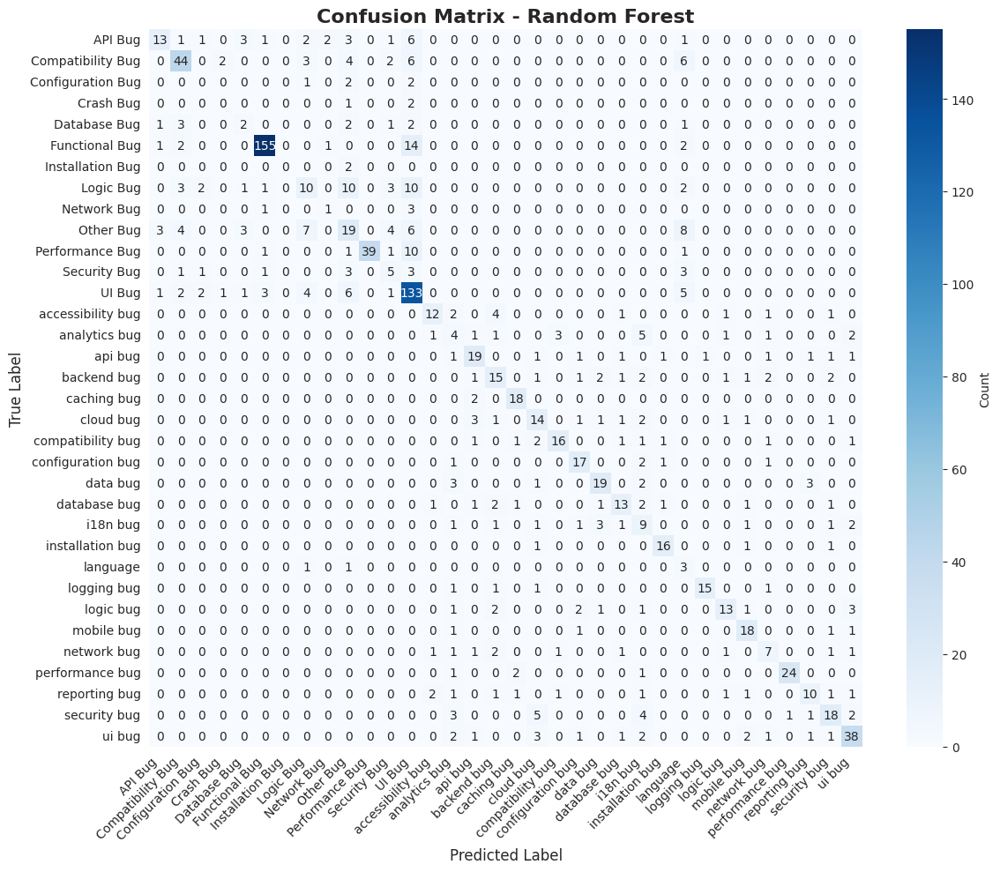

In [ ]:
print("\n" + "="*70)
print(f"DETAILED EVALUATION: {best_model_name}")
print("="*70)

y_pred_best = results[best_model_name]['y_pred']

# Get all unique labels present in both true and predicted values
# This ensures that classes present in y_test but not y_pred, or vice-versa, are included
all_unique_labels = np.unique(np.concatenate((y_test, y_pred_best)))

# Filter target names based on these unique labels
filtered_target_names = [le.classes_[label] for label in all_unique_labels]

# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_best,
                          labels=all_unique_labels, # Specify labels to report on
                          target_names=filtered_target_names,
                          digits=4))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_best, labels=all_unique_labels)
plt.figure(figsize=(12, 10)) # Increased figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=filtered_target_names,
            yticklabels=filtered_target_names,
            cbar_kws={'label': 'Count'})
plt.title(f'Confusion Matrix - {best_model_name}', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


WORD CLOUD VISUALIZATION


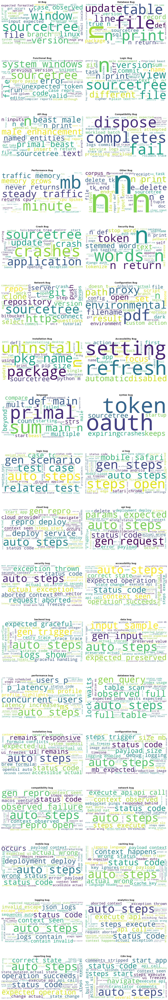

In [ ]:
print("\n" + "="*70)
print("WORD CLOUD VISUALIZATION")
print("="*70)

unique_bug_types = df['Bug_Type'].unique()
n_types = len(unique_bug_types)
cols = 2
rows = (n_types + 1) // 2

plt.figure(figsize=(15, rows * 5))

for idx, bug_type in enumerate(unique_bug_types, 1):
    plt.subplot(rows, cols, idx)

    # Get text for this bug type
    bug_text = ' '.join(df[df['Bug_Type'] == bug_type]['Cleaned_Text'].values)

    # Generate word cloud
    if bug_text.strip():
        wordcloud = WordCloud(width=800, height=400,
                            background_color='white',
                            colormap='viridis',
                            max_words=50).generate(bug_text)

        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'{bug_type}', fontsize=14, fontweight='bold')
        plt.axis('off')
    else:
        plt.text(0.5, 0.5, 'No data', ha='center', va='center')
        plt.title(f'{bug_type}', fontsize=14, fontweight='bold')
        plt.axis('off')

plt.tight_layout()
plt.show()

PREDICTION FUNCTION

In [ ]:
print("\n" + "="*70)
print("BUG DETECTION FUNCTION")
print("="*70)

def detect_bug_presence(text, model=best_model, vectorizer=tfidf, threshold=0.3):
    """
    Detect if a bug is present in the given text

    Args:
        text: Bug report or description text
        model: Trained model
        vectorizer: Fitted TF-IDF vectorizer
        threshold: Probability threshold for bug detection (default 0.5)

    Returns:
        Dictionary with bug detection results
    """
    # Clean text
    cleaned = clean_text(text)

    # Vectorize
    text_tfidf = vectorizer.transform([cleaned])

    # Keywords that strongly suggest bugs
    bug_keywords = [
        'crash', 'error', 'bug', 'fail', 'broken', 'issue', 'problem',
        'not working', 'exception', 'timeout', 'freeze', 'hang', 'stuck',
        'incorrect', 'invalid', 'null', 'undefined', 'missing', 'unable'
    ]

    # Count bug keywords in text
    cleaned_lower = cleaned.lower()
    keyword_count = sum(1 for keyword in bug_keywords if keyword in cleaned_lower)
    keyword_score = min(keyword_count * 10, 40)  # Max 40% from keywords

    # Get model prediction probabilities
    if hasattr(model, 'predict_proba'):
        # For multi-class models, check if any bug type is predicted with confidence
        probabilities = model.predict_proba(text_tfidf)[0]
        max_prob = max(probabilities) * 100

        # Calculate bug presence score (combination of model confidence and keywords)
        bug_score = (max_prob * 0.7) + keyword_score  # 70% model, 30% keywords
        bug_score = min(bug_score, 100)  # Cap at 100%

    else:
        # If no probabilities, use keyword-based detection
        bug_score = keyword_score + 50  # Base score of 50%
        bug_score = min(bug_score, 100)

    # Determine if bug is present based on threshold
    is_bug_present = bug_score >= (threshold * 100)

    # Calculate confidence level
    if bug_score >= 80:
        confidence_level = "Very High"
    elif bug_score >= 60:
        confidence_level = "High"
    elif bug_score >= 40:
        confidence_level = "Medium"
    else:
        confidence_level = "Low"

    return {
        'text': text[:100] + '...' if len(text) > 100 else text,
        'is_bug_present': is_bug_present,
        'bug_score': bug_score,
        'confidence_level': confidence_level,
        'keyword_matches': keyword_count,
        'status': '🔴 BUG DETECTED' if is_bug_present else '🟢 NO BUG DETECTED'
    }

# Test bug detection on sample texts
print("\nTesting Bug Detection on Sample Texts:\n")
print("="*70)

test_texts = [
    # Bug examples - should detect as bugs
    "The application crashes when clicking the submit button",
    "Unable to connect to database server timeout error",
    "User interface layout is broken on mobile devices",
    "API returns incorrect response format",
    "Null pointer exception thrown at line 245",
    "System freezes and becomes unresponsive after 5 minutes",

    # Non-bug examples - should NOT detect as bugs
    "How do I configure the email settings in my profile",
    "Feature request: please add dark mode support",
    "Thank you for the latest update, works perfectly",
    "Successfully logged in and updated my profile information",
    "Can you provide documentation for the REST API endpoints",
    "What are the system requirements for this application"
]

print("\n🔍 BUG DETECTION RESULTS:\n")

bugs_detected = 0
no_bugs_detected = 0

for idx, text in enumerate(test_texts, 1):
    result = detect_bug_presence(text)

    print(f"\n{'='*70}")
    print(f"Test Case #{idx}")
    print(f"{'='*70}")
    print(f"📝 Text: \"{result['text']}\"")
    print(f"\n{result['status']}")
    print(f"   Bug Score: {result['bug_score']:.2f}%")
    print(f"   Confidence Level: {result['confidence_level']}")
    print(f"   Bug Keywords Found: {result['keyword_matches']}")

    # Visual progress bar
    bar_length = int(result['bug_score'] / 5)
    if result['is_bug_present']:
        print(f"   🔴 Bug Meter: [{'█' * bar_length}{'░' * (20 - bar_length)}] {result['bug_score']:.1f}%")
        bugs_detected += 1
    else:
        print(f"   🟢 Safe Meter: [{'█' * bar_length}{'░' * (20 - bar_length)}] {result['bug_score']:.1f}%")
        no_bugs_detected += 1

# Summary statistics
print(f"\n{'='*70}")
print("DETECTION SUMMARY")
print(f"{'='*70}")
print(f"Total Tests: {len(test_texts)}")
print(f"🔴 Bugs Detected: {bugs_detected}")
print(f"🟢 No Bugs: {no_bugs_detected}")
print(f"Detection Rate: {(bugs_detected/len(test_texts))*100:.1f}%")

# Additional usage examples
print(f"\n{'='*70}")
print("USAGE EXAMPLES")
print(f"{'='*70}")
print("""
# Basic usage:
result = detect_bug_presence("Application crashes on startup")
if result['is_bug_present']:
    print(f"⚠️ Bug detected! Score: {result['bug_score']:.1f}%")

# With custom threshold (more sensitive):
result = detect_bug_presence("App is slow", threshold=0.3)

# With custom threshold (more strict):
result = detect_bug_presence("App is slow", threshold=0.7)

# Check specific fields:
print(result['status'])              # 🔴 BUG DETECTED or 🟢 NO BUG DETECTED
print(result['is_bug_present'])      # True or False
print(result['bug_score'])           # 0-100
print(result['confidence_level'])    # Very High, High, Medium, Low
print(result['keyword_matches'])     # Number of bug-related keywords found
""")


BUG DETECTION FUNCTION

Testing Bug Detection on Sample Texts:


🔍 BUG DETECTION RESULTS:


Test Case #1
📝 Text: "The application crashes when clicking the submit button"

🟢 NO BUG DETECTED
   Bug Score: 29.60%
   Confidence Level: Low
   Bug Keywords Found: 1
   🟢 Safe Meter: [█████░░░░░░░░░░░░░░░] 29.6%

Test Case #2
📝 Text: "Unable to connect to database server timeout error"

🔴 BUG DETECTED
   Bug Score: 60.10%
   Confidence Level: High
   Bug Keywords Found: 3
   🔴 Bug Meter: [████████████░░░░░░░░] 60.1%

Test Case #3
📝 Text: "User interface layout is broken on mobile devices"

🟢 NO BUG DETECTED
   Bug Score: 26.13%
   Confidence Level: Low
   Bug Keywords Found: 1
   🟢 Safe Meter: [█████░░░░░░░░░░░░░░░] 26.1%

Test Case #4
📝 Text: "API returns incorrect response format"

🔴 BUG DETECTED
   Bug Score: 42.90%
   Confidence Level: Medium
   Bug Keywords Found: 1
   🔴 Bug Meter: [████████░░░░░░░░░░░░] 42.9%

Test Case #5
📝 Text: "Null pointer exception thrown at line 245"

🔴 BUG DETE

In [ ]:
print("\n" + "="*70)
print("MODEL SAVING")
print("="*70)

import pickle

# Save the model, vectorizer, and label encoder
model_data = {
    'model': best_model,
    'vectorizer': tfidf,
    'label_encoder': le,
    'model_name': best_model_name
}

with open('bug_detection_model.pkl', 'wb') as f:
    pickle.dump(model_data, f)

print("✅ Model saved successfully as 'bug_detection_model.pkl'")
print("\nTo load the model later, use:")
print("""
with open('bug_detection_model.pkl', 'rb') as f:
    model_data = pickle.load(f)

model = model_data['model']
vectorizer = model_data['vectorizer']
label_encoder = model_data['label_encoder']
""")


MODEL SAVING
✅ Model saved successfully as 'bug_detection_model.pkl'

To load the model later, use:

with open('bug_detection_model.pkl', 'rb') as f:
    model_data = pickle.load(f)

model = model_data['model']
vectorizer = model_data['vectorizer']
label_encoder = model_data['label_encoder']



In [ ]:
print("\n" + "="*70)
print("INTERACTIVE BUG DETECTION - USER INPUT")
print("="*70)

def interactive_bug_detection():
    """
    Interactive function for users to test bug detection with their own text
    """
    print("\n🔍 Welcome to Interactive Bug Detection System!")
    print("="*70)
    print("You can test the model with your own bug reports or descriptions.")
    print("Type 'quit', 'exit', or 'q' to stop testing.\n")

    test_count = 0
    bugs_found = 0

    while True:
        print("\n" + "-"*70)
        user_input = input("\nEnter your text to check for bugs:\n> ").strip()

        # Exit conditions
        if user_input.lower() in ['quit', 'exit', 'q', '']:
            print("\nExiting interactive mode...")
            break

        test_count += 1

        # Detect bug
        result = detect_bug_presence(user_input)

        if result['is_bug_present']:
            bugs_found += 1

        # Display results
        print("\n" + "="*70)
        print("🔬 ANALYSIS RESULTS")
        print("="*70)
        print(f"\n{result['status']}")
        print(f"\n📊 Detection Metrics:")
        print(f"   • Bug Score: {result['bug_score']:.2f}%")
        print(f"   • Confidence Level: {result['confidence_level']}")
        print(f"   • Bug Keywords Found: {result['keyword_matches']}")

        # Visual meter
        bar_length = int(result['bug_score'] / 5)
        if result['is_bug_present']:
            print(f"\n   🔴 Bug Meter: [{'█' * bar_length}{'░' * (20 - bar_length)}] {result['bug_score']:.1f}%")
            print("\n   ⚠️  RECOMMENDATION: This appears to be a bug report.")
            print("   Action: Route to development team for investigation.")
        else:
            print(f"\n   🟢 Safe Meter: [{'█' * bar_length}{'░' * (20 - bar_length)}] {result['bug_score']:.1f}%")
            print("\n   ✅ RECOMMENDATION: This does not appear to be a bug.")
            print("   Action: Route to support/documentation team.")

        # Ask if user wants to continue
        print("\n" + "-"*70)
        continue_choice = input("\n🔄 Test another text? (yes/no): ").strip().lower()
        if continue_choice in ['no', 'n', 'quit', 'exit']:
            break

    # Final summary
    if test_count > 0:
        print("\n" + "="*70)
        print("📈 SESSION SUMMARY")
        print("="*70)
        print(f"Total Tests: {test_count}")
        print(f"🔴 Bugs Detected: {bugs_found}")
        print(f"🟢 Non-Bugs: {test_count - bugs_found}")
        print(f"Bug Detection Rate: {(bugs_found/test_count)*100:.1f}%")

    print("\n✅ Thank you for using the Bug Detection System!")

# Run interactive mode
print("\n" + "="*70)
print("STARTING INTERACTIVE MODE")
print("="*70)

# Option 1: Automatic interactive mode (uncomment to enable)
# interactive_bug_detection()

# Option 2: Manual single input test
print("\n📝 Quick Test Mode - Enter a single text to analyze:")
print("(For full interactive mode, call: interactive_bug_detection())")
print("\nExample inputs to try:")
print("  • 'Application crashes on startup'")
print("  • 'How do I reset my password'")
print("  • 'Database connection timeout error'")
print("  • 'Feature request: add dark mode'\n")

# Single input test
try:
    user_text = input("Enter text to analyze (or press Enter to skip): ").strip()

    if user_text:
        result = detect_bug_presence(user_text)

        print("\n" + "="*70)
        print("🔬 QUICK ANALYSIS RESULTS")
        print("="*70)
        print(f"\n📝 Your Input: \"{result['text']}\"")
        print(f"\n{result['status']}")
        print(f"\n📊 Metrics:")
        print(f"   • Bug Score: {result['bug_score']:.2f}%")
        print(f"   • Confidence: {result['confidence_level']}")
        print(f"   • Keywords Found: {result['keyword_matches']}")

        bar_length = int(result['bug_score'] / 5)
        if result['is_bug_present']:
            print(f"\n   🔴 [{'█' * bar_length}{'░' * (20 - bar_length)}] {result['bug_score']:.1f}%")
        else:
            print(f"\n   🟢 [{'█' * bar_length}{'░' * (20 - bar_length)}] {result['bug_score']:.1f}%")

        print("\n💡 To test multiple inputs, run: interactive_bug_detection()")
    else:
        print("\n⏭️  Skipped user input. Continuing with model saving...")

except Exception as e:
    print(f"\n⚠️  Input skipped or error: {e}")
    print("Continuing with model saving...")


INTERACTIVE BUG DETECTION - USER INPUT

STARTING INTERACTIVE MODE

📝 Quick Test Mode - Enter a single text to analyze:
(For full interactive mode, call: interactive_bug_detection())

Example inputs to try:
  • 'Application crashes on startup'
  • 'How do I reset my password'
  • 'Database connection timeout error'
  • 'Feature request: add dark mode'

Enter text to analyze (or press Enter to skip): 

⏭️  Skipped user input. Continuing with model saving...


In [ ]:
"""
AI-Based Bug Classification System - Colab Version with User Input
Optimized for 25-minute training time
"""

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import torch
from transformers import (
    DistilBertTokenizer,
    DistilBertForSequenceClassification,
    Trainer,
    TrainingArguments
)
from torch.utils.data import Dataset
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# ============================================
# 1. LOAD AND PREPROCESS DATA
# ============================================

def load_and_preprocess_data(csv_path):
    """Load and preprocess bug dataset quickly"""
    print("📂 Loading dataset...")
    df = pd.read_csv('/content/bug_classification_dataset_v2_7000_FULL_WITH_OTHER.csv')

    # Quick text combination
    df['text'] = (df['Title'].fillna('') + ' ' + df['Description'].fillna('')).str.strip()

    # Remove empty entries
    df = df[df['text'].str.len() > 10].reset_index(drop=True)

    print(f"✅ Loaded {len(df)} bug reports")
    print(f"📊 Bug categories: {df['Bug_Type'].nunique()}")
    print("Categories:", df['Bug_Type'].unique())

    return df

In [ ]:

# ============================================
# 2. PREPARE LABELS AND SPLIT DATA
# ============================================

def prepare_data_splits(df, test_size=0.2, random_state=42):
    """Quick label encoding and data splitting"""
    bug_types = sorted(df['Bug_Type'].unique())
    label2id = {label: idx for idx, label in enumerate(bug_types)}
    id2label = {idx: label for label, idx in label2id.items()}

    df['label'] = df['Bug_Type'].map(label2id)

    train_df, test_df = train_test_split(
        df,
        test_size=test_size,
        random_state=random_state,
        stratify=df['label']
    )

    print(f"📈 Training samples: {len(train_df)}")
    print(f"📉 Testing samples: {len(test_df)}")

    return train_df, test_df, label2id, id2label

In [ ]:
# ============================================
# 3. CREATE PYTORCH DATASET
# ============================================

class BugDataset(Dataset):
    """Fast PyTorch Dataset for bug reports"""
    def __init__(self, texts, labels, tokenizer, max_length=128):
        self.encodings = tokenizer(
            texts.tolist(),
            truncation=True,
            padding=True,
            max_length=max_length,
            return_tensors='pt'
        )
        self.labels = labels.tolist()

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

In [ ]:
# ============================================
# 4. FAST TRAIN MODEL (OPTIMIZED FOR SPEED) - FIXED VERSION
# ============================================

def train_model_fast(train_dataset, test_dataset, num_labels, output_dir='./bug_classifier_model_fast'):
    """Train DistilBERT model quickly within 25 minutes"""
    print("\n🤖 Initializing DistilBERT model...")

    model = DistilBertForSequenceClassification.from_pretrained(
        'distilbert-base-uncased',
        num_labels=num_labels
    )

    # OPTIMIZED Training arguments for speed - FIXED PARAMETERS
    training_args = TrainingArguments(
        output_dir=output_dir,
        num_train_epochs=2,
        per_device_train_batch_size=16,
        per_device_eval_batch_size=64,
        warmup_steps=100,
        weight_decay=0.01,
        logging_dir='./logs',
        logging_steps=50,
        eval_strategy="steps",  # CHANGED FROM evaluation_strategy TO eval_strategy
        eval_steps=200,
        save_strategy="no",
        load_best_model_at_end=False,
        metric_for_best_model="accuracy",
        dataloader_pin_memory=False,
        fp16=torch.cuda.is_available(),  # Enable if GPU available
        report_to="none",
    )

    def compute_metrics(pred):
        labels = pred.label_ids
        preds = pred.predictions.argmax(-1)
        acc = accuracy_score(labels, preds)
        return {'accuracy': acc}

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=test_dataset,
        compute_metrics=compute_metrics,
    )

    print("\n🚀 Starting FAST training (max 25 minutes)...")
    trainer.train()

    print("\n💾 Saving final model...")
    trainer.save_model(output_dir)

    return model, trainer

In [ ]:
# ============================================
# 5. PREDICTION FUNCTION FOR USER INPUT
# ============================================

class BugPredictor:
    def __init__(self, model_path):
        self.tokenizer = DistilBertTokenizer.from_pretrained(model_path)
        self.model = DistilBertForSequenceClassification.from_pretrained(model_path)
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model.to(self.device)

        # Load label mappings
        import json
        with open(f'{model_path}/id2label.json', 'r') as f:
            self.id2label = json.load(f)
        # Convert string keys to integers
        self.id2label = {int(k): v for k, v in self.id2label.items()}

    def predict_bug(self, title, description):
        # Combine title and description
        text = f"{title} {description}".strip()

        # Tokenize
        inputs = self.tokenizer(
            text,
            truncation=True,
            padding=True,
            max_length=128,
            return_tensors='pt'
        )

        # Move to device
        inputs = {k: v.to(self.device) for k, v in inputs.items()}

        # Predict
        self.model.eval()
        with torch.no_grad():
            outputs = self.model(**inputs)
            predictions = torch.nn.functional.softmax(outputs.logits, dim=-1)
            predicted_class = torch.argmax(predictions, dim=1).item()
            confidence = torch.max(predictions).item()

        predicted_label = self.id2label[predicted_class]

        return predicted_label, confidence

In [ ]:
# ============================================
# 6. INTERACTIVE USER INPUT FUNCTION
# ============================================

def interactive_prediction(predictor):
    """Interactive function for user to input bugs"""
    print("\n" + "="*50)
    print("🐛 BUG CLASSIFICATION INTERFACE")
    print("="*50)
    print("Enter bug details to classify (type 'quit' to exit)")

    while True:
        print("\n" + "-"*30)
        title = input("\n📝 Enter Bug Title: ").strip()

        if title.lower() == 'quit':
            break

        description = input("📄 Enter Bug Description: ").strip()

        if description.lower() == 'quit':
            break

        if not title and not description:
            print("❌ Please enter at least a title or description")
            continue

        print("\n🔮 Analyzing bug...")

        try:
            bug_type, confidence = predictor.predict_bug(title, description)

            print(f"\n✅ PREDICTION RESULTS:")
            print(f"   Bug Type: {bug_type}")
            print(f"   Confidence: {confidence:.2%}")
            print(f"   Title: {title}")
            print(f"   Description: {description[:100]}{'...' if len(description) > 100 else ''}")

        except Exception as e:
            print(f"❌ Error during prediction: {e}")

In [ ]:
# ============================================
# 7. MAIN EXECUTION
# ============================================

def main():
    import time
    start_time = time.time()

    # Configuration
    CSV_PATH = 'bug_classification_dataset_v2_7000_FULL_WITH_OTHER.csv'
    MODEL_OUTPUT_DIR = './bug_classifier_model_fast'

    print("⏰ Starting fast training (25-minute limit)...")
    print(f"💻 Using: {'GPU 🚀' if torch.cuda.is_available() else 'CPU'}")

    try:
        # Load data
        df = load_and_preprocess_data(CSV_PATH)

        # Prepare splits
        train_df, test_df, label2id, id2label = prepare_data_splits(df)

        # Save label mappings
        import json
        import os
        os.makedirs(MODEL_OUTPUT_DIR, exist_ok=True)
        with open(f'{MODEL_OUTPUT_DIR}/label2id.json', 'w') as f:
            json.dump(label2id, f)
        with open(f'{MODEL_OUTPUT_DIR}/id2label.json', 'w') as f:
            json.dump(id2label, f)

        # Initialize tokenizer
        print("\n🔤 Loading tokenizer...")
        tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
        tokenizer.save_pretrained(MODEL_OUTPUT_DIR)

        # Create datasets
        print("\n🔨 Creating PyTorch datasets...")
        train_dataset = BugDataset(train_df['text'], train_df['label'], tokenizer, max_length=128)
        test_dataset = BugDataset(test_df['text'], test_df['label'], tokenizer, max_length=128)

        # Train model quickly
        model, trainer = train_model_fast(train_dataset, test_dataset, len(label2id), MODEL_OUTPUT_DIR)

        # Quick evaluation
        print("\n📊 Quick evaluation...")
        predictions = trainer.predict(test_dataset)
        preds = predictions.predictions.argmax(-1)
        labels = predictions.label_ids
        acc = accuracy_score(labels, preds)
        print(f"✅ Model Accuracy: {acc:.4f}")

        end_time = time.time()
        total_time = (end_time - start_time) / 60
        print(f"\n✅ Training completed in {total_time:.2f} minutes!")

        # Start interactive prediction
        print("\n🎯 Loading predictor for user input...")
        predictor = BugPredictor(MODEL_OUTPUT_DIR)

        # Interactive user input
        interactive_prediction(predictor)

    except Exception as e:
        print(f"❌ Error: {e}")
        end_time = time.time()
        total_time = (end_time - start_time) / 60
        print(f"⏱️ Time elapsed: {total_time:.2f} minutes")

In [ ]:
# ============================================
# 8. QUICK TEST FUNCTION (Optional)
# ============================================

def quick_test():
    """Quick test if model is already trained"""
    try:
        predictor = BugPredictor('./bug_classifier_model_fast')
        print("✅ Model loaded successfully!")

        # Test prediction
        test_title = "Login button not working"
        test_description = "When clicking login button, nothing happens. User cannot access the application."

        bug_type, confidence = predictor.predict_bug(test_title, test_description)
        print(f"🧪 Test Prediction: {bug_type} (Confidence: {confidence:.2%})")

        # Start interactive mode
        interactive_prediction(predictor)

    except Exception as e:
        print(f"❌ Model not found or error: {e}")
        print("Please run the full training first.")

In [ ]:
from google.colab import files
files.upload()

Saving bug_classification_dataset_v2_7000_FULL_WITH_OTHER.csv to bug_classification_dataset_v2_7000_FULL_WITH_OTHER (1).csv


{'bug_classification_dataset_v2_7000_FULL_WITH_OTHER (1).csv': b'Bug_ID,Title,Description,Module,Severity,Bug_Type,Severity_Score,New_Bug_Type\nBUG-00001,SourceTree 3.4.8 keep crashing ,"All of the sudden sourcetree crashes. So I tried uninstall, delete the\xc3\x82\xc2\xa0C:\\Users\\\\{userName}\\AppData\\Local\\SourceTreeC:\\Users\\\\{userName}\\AppData\\Local\\Atlassianfolder and reinstall. Reinstall starts but then crashes.Windows 11 Version 21H2 (OS buiold 22000.675)Faulting application name: SourceTree.exe, version: 3.4.8.0, time stamp: 0x6215d589Faulting module name: KERNELBASE.dll, version: 10.0.22000.675, time stamp: 0x8d5bd3daException code: 0xe0434352Fault offset: 0x000000000004474cFaulting process id: 0x6668Faulting application start time: 0x01d86c7eeaa5e1e7Faulting application path: C:\\Users\\\\{userName}\\AppData\\Local\\SourceTree\\app-3.4.8\\SourceTree.exeFaulting module path: C:\\WINDOWS\\System32\\KERNELBASE.dllReport Id: 67910bba-acdc-4529-a4db-e6bdb0520982Faulting p

In [ ]:
!ls /content

'bug_classification_dataset_v2_7000_FULL_WITH_OTHER (1).csv'
 bug_classification_dataset_v2_7000_FULL_WITH_OTHER.csv
 bug_classification_dataset_v2_7000_MERGED_RECLASSIFIED.csv
 bug_classifier_model_fast
 bug_detection_model.pkl
 sample_data


In [ ]:
# ============================================
# RUN THE CODE
# ============================================

if __name__ == "__main__":
    print("Choose an option:")
    print("1. Train new model and start prediction")
    print("2. Use existing model (if available)")

    choice = input("Enter choice (1 or 2): ").strip()

    if choice == "2":
        quick_test()
    else:
        main()

Choose an option:
1. Train new model and start prediction
2. Use existing model (if available)
Enter choice (1 or 2): 1
⏰ Starting fast training (25-minute limit)...
💻 Using: GPU 🚀
📂 Loading dataset...
✅ Loaded 4853 bug reports
📊 Bug categories: 36
Categories: ['UI Bug' 'Database Bug' 'Functional Bug' 'Logic Bug' 'API Bug'
 'Compatibility Bug' 'Performance Bug' 'Other Bug' 'Crash Bug'
 'Security Bug' 'Network Bug' 'Configuration Bug' 'Installation Bug'
 'Accessibility Bug' 'language' 'syntax bug' 'logic bug' 'ui bug'
 'cloud bug' 'api bug' 'security bug' 'accessibility bug' 'backend bug'
 'data bug' 'performance bug' 'database bug' 'installation bug'
 'configuration bug' 'compatibility bug' 'network bug' 'mobile bug'
 'caching bug' 'logging bug' 'analytics bug' 'reporting bug' 'i18n bug']
📈 Training samples: 3882
📉 Testing samples: 971

🔤 Loading tokenizer...



🔨 Creating PyTorch datasets...

🤖 Initializing DistilBERT model...


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

DistilBertForSequenceClassification LOAD REPORT from: distilbert-base-uncased
Key                     | Status     | 
------------------------+------------+-
vocab_layer_norm.weight | UNEXPECTED | 
vocab_transform.bias    | UNEXPECTED | 
vocab_projector.bias    | UNEXPECTED | 
vocab_layer_norm.bias   | UNEXPECTED | 
vocab_transform.weight  | UNEXPECTED | 
classifier.weight       | MISSING    | 
pre_classifier.weight   | MISSING    | 
pre_classifier.bias     | MISSING    | 
classifier.bias         | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
`logging_dir` is deprecated and will be removed in v5.2. Please set `TENSORBOARD_LOGGING_DIR` instead.



🚀 Starting FAST training (max 25 minutes)...


Step,Training Loss,Validation Loss,Accuracy
200,1.962062,1.809123,0.543769
400,1.119031,1.062163,0.801236



💾 Saving final model...


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


📊 Quick evaluation...


✅ Model Accuracy: 0.8105

✅ Training completed in 0.58 minutes!

🎯 Loading predictor for user input...


Loading weights:   0%|          | 0/104 [00:00<?, ?it/s]


🐛 BUG CLASSIFICATION INTERFACE
Enter bug details to classify (type 'quit' to exit)

------------------------------

📝 Enter Bug Title: quit


Loading weights:   0%|          | 0/104 [00:00<?, ?it/s]

📊 Generating predictions for 971 test samples...


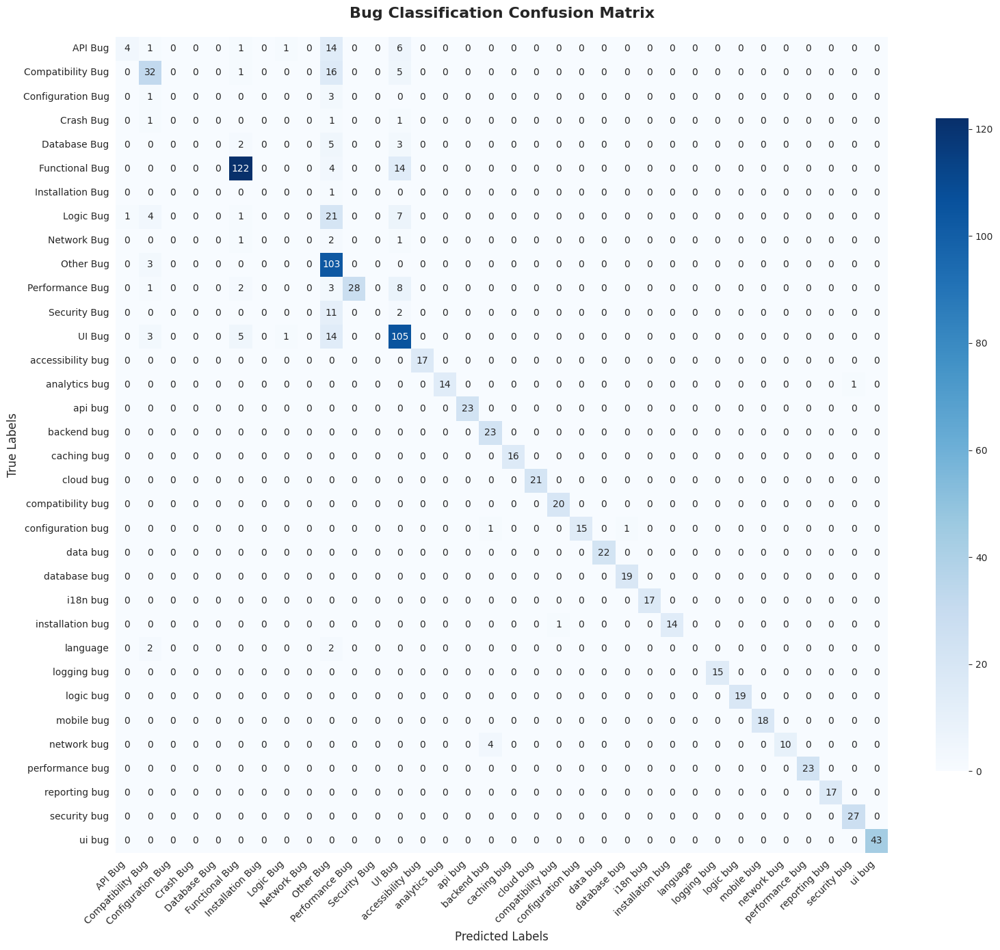


📈 CLASSIFICATION REPORT
                   precision    recall  f1-score   support

          API Bug       0.80      0.15      0.25        27
Compatibility Bug       0.67      0.59      0.63        54
Configuration Bug       0.00      0.00      0.00         4
        Crash Bug       0.00      0.00      0.00         3
     Database Bug       0.00      0.00      0.00        10
   Functional Bug       0.90      0.87      0.89       140
 Installation Bug       0.00      0.00      0.00         1
        Logic Bug       0.00      0.00      0.00        34
      Network Bug       0.00      0.00      0.00         4
        Other Bug       0.52      0.97      0.67       106
  Performance Bug       1.00      0.67      0.80        42
     Security Bug       0.00      0.00      0.00        13
           UI Bug       0.69      0.82      0.75       128
accessibility bug       1.00      1.00      1.00        17
    analytics bug       1.00      0.93      0.97        15
          api bug       1.00  

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import pandas as pd
import torch
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification
import json

def plot_confusion_matrix_from_model():
    """Plot confusion matrix using the trained model"""

    # Load the trained model and components
    MODEL_PATH = './bug_classifier_model_fast'

    try:
        # Load predictor
        predictor = BugPredictor(MODEL_PATH)

        # Load test data to get true labels
        df = pd.read_csv('/content/bug_classification_dataset_v2_7000_FULL_WITH_OTHER.csv')
        df['text'] = (df['Title'].fillna('') + ' ' + df['Description'].fillna('')).str.strip()
        df = df[df['text'].str.len() > 10].reset_index(drop=True)

        # Prepare test split (same as during training)
        from sklearn.model_selection import train_test_split
        bug_types = sorted(df['Bug_Type'].unique())
        label2id = {label: idx for idx, label in enumerate(bug_types)}
        df['label'] = df['Bug_Type'].map(label2id)

        _, test_df = train_test_split(
            df, test_size=0.2, random_state=42, stratify=df['label']
        )

        print(f"📊 Generating predictions for {len(test_df)} test samples...")

        # Get predictions
        true_labels = []
        predicted_labels = []

        for idx, row in test_df.iterrows():
            true_label = row['Bug_Type']
            pred_label, confidence = predictor.predict_bug(row['Title'], row['Description'])

            true_labels.append(true_label)
            predicted_labels.append(pred_label)

        # Create confusion matrix
        labels = sorted(list(set(true_labels + predicted_labels)))
        cm = confusion_matrix(true_labels, predicted_labels, labels=labels)

        # Plot confusion matrix
        plt.figure(figsize=(16, 14))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                   xticklabels=labels, yticklabels=labels,
                   cbar_kws={'shrink': 0.8})

        plt.title('Bug Classification Confusion Matrix', fontsize=16, fontweight='bold', pad=20)
        plt.xlabel('Predicted Labels', fontsize=12)
        plt.ylabel('True Labels', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

        # Print classification report
        print("\n" + "="*60)
        print("📈 CLASSIFICATION REPORT")
        print("="*60)
        print(classification_report(true_labels, predicted_labels, target_names=labels, zero_division=0))

        # Calculate overall accuracy
        accuracy = np.sum(np.array(true_labels) == np.array(predicted_labels)) / len(true_labels)

    except Exception as e:
        print(f"❌ Error: {e}")
        print("Please make sure the model is trained and available at './bug_classifier_model_fast'")

# Run the confusion matrix plot
plot_confusion_matrix_from_model()

# **UI trial**

In [ ]:
!pip install gradio
import gradio as gr

In [ ]:
!pip install easyocr pillow


In [ ]:
import easyocr
import numpy as np
from PIL import Image

reader = easyocr.Reader(['en'], gpu=False)

def image_to_text(image_path):
    """
    Perform OCR on uploaded image
    """
    if image_path is None:
        return ""

    result = reader.readtext(image_path)
    extracted_text = " ".join([text for _, text, _ in result])

    return extracted_text.strip()


In [ ]:
def ui_detect_bug(text, image):
    if (not text or not text.strip()) and image is None:
        return "❌ Please enter text or upload a screenshot."

    extracted_text = text.strip() if text.strip() else image_to_text(image)

    result = detect_bug_presence(extracted_text)

    return f"""
📝 Extracted Text:
{extracted_text}

{result['status']}

📊 Bug Score: {result['bug_score']:.2f}%
🔍 Confidence Level: {result['confidence_level']}
🔑 Bug Keywords Found: {result['keyword_matches']}
"""


In [ ]:
classifier = BugPredictor('./bug_classifier_model_fast')


Loading weights:   0%|          | 0/104 [00:00<?, ?it/s]

In [ ]:
def ui_classify_bug(text, image):
    if (not text or not text.strip()) and image is None:
        return "❌ Please enter text or upload a screenshot."

    extracted_text = text.strip() if text.strip() else image_to_text(image)

    bug_type, confidence = classifier.predict_bug("", extracted_text)

    return f"""
🧠 Bug Classification Result

📝 Extracted Text:
{extracted_text}

🐞 Predicted Bug Type: {bug_type}
📊 Confidence: {confidence:.2%}
"""


In [ ]:
def ui_resolve_bug(image):
    return """
🛠 Bug Resolution Module

This feature is under development.
Planned features:
• Root cause analysis
• Fix recommendations
• Code snippet suggestions
"""


In [ ]:
import gradio as gr

with gr.Blocks(theme=gr.themes.Default()) as demo:
    gr.Markdown("# 🐞 BugLens: A Hybrid AI-Based Software Bug Management System")
    gr.Markdown("Enter issue text OR upload a screenshot (OCR enabled).")

    text_input = gr.Textbox(
        label="Issue Description (Optional)",
        lines=5,
        placeholder="e.g., App crashes when clicking login"
    )

    image_input = gr.Image(
        label="Upload Screenshot (Optional)",
        type="filepath"
    )

    with gr.Row():
        detect_btn = gr.Button("Detect Bug")
        classify_btn = gr.Button("Classify Bug")
        resolve_btn = gr.Button("Resolve Bug")

    output = gr.Textbox(label="Output", lines=15)

    detect_btn.click(ui_detect_bug, [text_input, image_input], output)
    classify_btn.click(ui_classify_bug, [text_input, image_input], output)
    resolve_btn.click(ui_resolve_bug, image_input, output)

demo.launch()


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://5cf37dcac4d1b4ff33.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
